# Изучение данных

- [Гипотеза №1](#hypothesis1)
- [Гипотеза №2](#hypothesis2)
- [Гипотеза №3](#hypothesis3)

## Подготовка


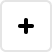
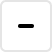
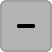
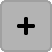
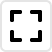
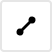
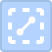
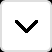
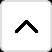
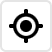

In [1]:
import numpy as np
import pandas as pd

from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()

In [2]:
FONT_FACES = {
    "train": [
        "Courier",
        "Geneva",
        "Georgia",
        "Helvetica",
        "Lucida Grande",
        "Times New Roman",
        "Verdana",
    ],
    "test": [
        "Arial",
        "Brush Script MT",
        "Lucida Console",
        "Wingdings",
    ],
}

In [3]:
def get_df(path, df_type):
    result_df = pd.read_csv(path)
    result_df = result_df[result_df.font_face.isin(FONT_FACES[df_type])].reset_index(drop=True)
    result_df.fillna("", inplace=True)

    return result_df

def plot_matrix(plots=[], width=400, height=300, columns=2):
    bunch = GGBunch()
    for i in range(len(plots)):
        row = int(i / columns)
        column = i % columns
        bunch.add_plot(plots[i], column * width, row * height, width, height)
    return bunch.show()

In [4]:
char_widths_df = get_df("../data/char_widths.csv", "train")
char_widths_df.head()

,char_id,char,alphabet,font_face,font_size,font_version,width
0,65,A,basic_latin,Courier,9,,9
1,66,B,basic_latin,Courier,9,,9
2,67,C,basic_latin,Courier,9,,9
3,68,D,basic_latin,Courier,9,,9
4,69,E,basic_latin,Courier,9,,9


<a class="anchor" id="hypothesis1"></a>
## Гипотеза №1: За размер и версию шрифта отвечает один коэффициент

В первом типе графиков чем выше "ящики" - тем хуже вариация шрифта будет предсказываться по базовой версии (20pt, без искажений). И наоборот, полностью вырожденный в отрезок "ящик" означает, что достаточно знать коэффициенты толщины символов лишь для базовой версии шрифта, чтобы данную вариацию получить домножением на определённый коэффициент.

Во втором типе графиков чем дальше точки от сглаживающей прямой - тем, опять же, хуже для предсказаний.

Первая пара графиков относится к вариациям шрифтов по размеру, вторая - по жирности и курсивности.

Действительно хорошие предсказания по размеру относятся только к Courier, плюс некоторые дополнительные исключения.

По жирности и курсивности также отличается Courier. В целом, создаётся впечатление, что жирность более просто пересчитывается, чем курсивность.

В целом, если хочется иметь единое решение, лучше иметь отдельную модель не только для каждого шрифта, но также для каждого его состояния - для других размеров, а также для жирной и курсивной версий.

In [5]:
def get_font_widths(df, font_size, font_version):
    return df[
        (df.font_size == font_size) &
        (df.font_version == font_version)
    ][["char", "alphabet", "font_face", "width"]]\
        .sort_values(["alphabet", "font_face", "width", "char"])\
        .reset_index(drop=True)

def get_variants_by_size(df, basic_size=20, basic_version=""):
    return pd.concat(
        [pd.merge(get_font_widths(df, basic_size, basic_version),
                  get_font_widths(df, font_size, basic_version),
                  on=["char", "alphabet", "font_face"],
                  suffixes=("_basic", "_variant"))\
             .assign(width_ratio=lambda x: x.width_variant / x.width_basic, \
                     font_size_basic=lambda x: basic_size, \
                     font_size_variant=lambda x: font_size)
         for font_size in df.font_size.unique() if font_size != basic_size]
    ).reset_index(drop=True)

def get_variants_by_version(df, basic_size=20, basic_version=""):
    return pd.concat(
        [pd.merge(get_font_widths(df, basic_size, basic_version),
                  get_font_widths(df, basic_size, font_version),
                  on=["char", "alphabet", "font_face"],
                  suffixes=("_basic", "_variant"))\
             .assign(width_ratio=lambda x: x.width_variant / x.width_basic, \
                     font_version_basic=lambda x: basic_version, \
                     font_version_variant=lambda x: font_version)
         for font_version in df.font_version.unique() if font_version != basic_version]
    ).reset_index(drop=True)

In [6]:
vbs_df = get_variants_by_size(char_widths_df)
vbs_df.head()

,char,alphabet,font_face,width_basic,width_variant,width_ratio,font_size_basic,font_size_variant
0,,basic_latin,Courier,12,9,0.75,20,9
1,!,basic_latin,Courier,12,9,0.75,20,9
2,"""",basic_latin,Courier,12,9,0.75,20,9
3,#,basic_latin,Courier,12,9,0.75,20,9
4,$,basic_latin,Courier,12,9,0.75,20,9


In [7]:
ggplot(vbs_df, aes("font_size_variant", "width_ratio")) + \
    geom_boxplot(aes(group="alphabet", fill="alphabet"), \
                 tooltips=layer_tooltips().line("Alphabet|@alphabet")\
                                          .line("Font face|@font_face")\
                                          .line("Variant of font size|@font_size_variant")\
                                          .line("Basic font size|@font_size_basic"), \
                 show_legend=False) + \
    facet_grid(y="font_face") + \
    ggsize(1000, 4000)

In [8]:
plots = [
    ggplot(vbs_df[vbs_df.font_face == font_face], aes("width_basic", "width_variant")) + \
        geom_point(shape=21, color="black", fill="#3182bd") + \
        geom_smooth(color="#de2d26") + \
        facet_grid(x="alphabet", y="font_size_variant") + \
        ggtitle(font_face)
    for font_face in vbs_df.font_face.unique()
]

plot_matrix(plots, width=1000, height=1000, columns=1)

In [9]:
vbv_df = get_variants_by_version(char_widths_df)
vbv_df.head()

,char,alphabet,font_face,width_basic,width_variant,width_ratio,font_version_basic,font_version_variant
0,,basic_latin,Courier,12,13,1.083333,,b
1,!,basic_latin,Courier,12,13,1.083333,,b
2,"""",basic_latin,Courier,12,13,1.083333,,b
3,#,basic_latin,Courier,12,13,1.083333,,b
4,$,basic_latin,Courier,12,13,1.083333,,b


In [10]:
ggplot(vbv_df, aes("font_version_variant", "width_ratio")) + \
    geom_boxplot(aes(group="alphabet", fill="alphabet"), \
                 tooltips=layer_tooltips().line("Alphabet|@alphabet")\
                                          .line("Font face|@font_face")\
                                          .line("Variant of font version|@font_version_variant")\
                                          .line("Basic font version|@font_version_basic"), \
                 show_legend=False) + \
    facet_grid(y="font_face") + \
    ggsize(1000, 4000)

In [11]:
plots = [
    ggplot(vbv_df[vbv_df.font_face == font_face], aes("width_basic", "width_variant")) + \
        geom_point(shape=21, color="black", fill="#3182bd") + \
        geom_smooth(color="#de2d26") + \
        facet_grid(x="alphabet", y="font_version_variant") + \
        ggtitle(font_face)
    for font_face in vbs_df.font_face.unique()
]

plot_matrix(plots, width=1000, height=1000, columns=1)

<a class="anchor" id="hypothesis2"></a>
## Гипотеза №2: Целое равно сумме своих частей

Судя по первому графику, несостыковки возникают только для курсивных версий шрифтов. Courier - особый случай, для которого наиболее хорошо работают предсказания ширины по отдельным символам. Также нет проблем с японским алфавитом.

Второй график показывает, что ошибка стабилизируется с увеличением размера текста. Значит, можно попробовать использовать ее для улучшения предсказаний.

In [12]:
class ExactModel:

    def __init__(self):
        self.features = ["alphabet", "font_face", "font_size", "font_version"]

    def fit(self, df):
        self.char_widths = df.set_index(self.features + ["char"]).width

        return self

    def predict_char(self, char, features):
        return self.char_widths.loc[tuple(features + [char])]

    def predict_string(self, string, features):
        return int(np.array([self.predict_char(c, features) for c in string]).sum())

    def predict(self, df, target):
        df = df.assign(prediction=lambda x: np.nan)
        for (i, d) in df.iterrows():
            df.loc[i, "prediction"] = self.predict_string(d[target], list(d[self.features]))
        df.prediction = df.prediction.astype(int)

        return df

In [13]:
def get_em_df(df):
    e_model = ExactModel().fit(char_widths_df)
    result_df = get_df("../data/control.csv", "train")
    return e_model.predict(result_df, "text")

In [14]:
em_df = get_em_df(char_widths_df)
em_df = em_df.assign(
    add_error=lambda d: d.prediction - d.width,
    mult_error=lambda d: d.prediction / d.width
)
em_df = em_df.assign(has_error=np.where(em_df.add_error > 0, 1, 0))
em_df.head()

,text,width,alphabet,font_face,font_size,font_version,symbols_count,prediction,add_error,mult_error,has_error
0,溝。,25,japanese,Courier,9,,2.0,25,0,1.0,0
1,高い。,37,japanese,Courier,9,,3.0,37,0,1.0,0
2,今日。,40,japanese,Courier,9,,3.0,40,0,1.0,0
3,リニア。,41,japanese,Courier,9,,4.0,41,0,1.0,0
4,リニア。,41,japanese,Courier,9,,4.0,41,0,1.0,0


In [15]:
ggplot(em_df, aes("font_version")) + \
    geom_bar(aes(group="has_error", fill=as_discrete("has_error"))) + \
    facet_grid(x="alphabet", y="font_face") + \
    scale_fill_manual(values=["#4daf4a", "#e41a1c"])

In [16]:
ggplot(em_df[em_df.font_version == "i"], aes("width", "mult_error")) + \
    geom_line(color="black") + \
    geom_point(aes(color="mult_error")) + \
    scale_color_gradient(low="#1a9641", high="#d7191c") + \
    facet_grid(x="alphabet", y="font_face")

<a class="anchor" id="hypothesis3"></a>
## Гипотеза №3: Символы не меняют кластеры

Для данного шрифта `F` каждому символу `X` каждого алфавита можно поставить в соответствие число `p(X, F)` - число символов для того же самого шрифта и алфавита, которые по ширине меньше данного. Так символы упорядочиваются по ширине относительно друг друга, причем для задания этого порядка используются сравнимые величины (в отличие от толщины в пикселях).

Дальнейшие графики направлены на поиск тенденций среди этих порядков.

Первый график надо читать следующим образом. Чем точка правее - тем шире данный символ относительно остальных (в среднем, по всем шрифтам). Чем точка выше - тем больше может меняться относительная позиция символа в зависимости от шрифта. Таким образом, чем ближе к `0` по оси `y` находится символ, тем более уверенно можно пытаться предсказывать его кластер.

Второй график располагает символы по порядку, от узких к широким (по их медианной позиции относительно остальных символов алфавита). Более важным показателем здесь являются высоты "ящиков". Чем больше "ящик" выступает вверх - тем больше шансов для символа в каком-то конкретном шрифте оказаться правее, чем он должен быть в среднем. Чем больше "ящик" выступает вниз - тем больше шансов, что символ наоборот может оказаться левее.

Третий график - версия второго с нормированными ширинами символов.

In [17]:
def char_weight(char, alphabet, font_face, font_size, font_version):
    font_df = char_widths_df[
        (char_widths_df.alphabet == alphabet)&
        (char_widths_df.font_face == font_face)&
        (char_widths_df.font_size == font_size)&
        (char_widths_df.font_version == font_version)
    ]
    if font_df.width.min() == font_df.width.max():
        return np.nan
    char_width = font_df[font_df.char == char].iloc[0].width

    return np.where(font_df.width < char_width, 1, 0).sum()

def get_char_weights_df(df):
    font_multiindex = df.groupby(["font_face", "font_size", "font_version"]).width.max().index
    result_df = pd.DataFrame(columns=df.groupby(["alphabet", "char"]).char_id.max().index)
    for alphabet, char in result_df.columns:
        result_df[alphabet, char] = pd.Series(data={t: char_weight(char, alphabet, t[0], t[1], t[2]) for t in font_multiindex}, index=font_multiindex)
    return result_df

In [18]:
char_weights_df = get_char_weights_df(char_widths_df)
char_weights_df.head()

alphabet                         basic_latin                                  \
char                                           !   "   #   $   %   &   '   (   
font_face font_size font_version                                               
Courier   9                              NaN NaN NaN NaN NaN NaN NaN NaN NaN   
                    b                    NaN NaN NaN NaN NaN NaN NaN NaN NaN   
                    bi                   NaN NaN NaN NaN NaN NaN NaN NaN NaN   
                    i                    NaN NaN NaN NaN NaN NaN NaN NaN NaN   
          11                             NaN NaN NaN NaN NaN NaN NaN NaN NaN   

alphabet                              ... russian                              \
char                               )  ...       ц   ч   ш   щ   ъ   ы   ь   э   
font_face font_size font_version      ...                                       
Courier   9                      NaN  ...     NaN NaN NaN NaN NaN NaN NaN NaN   
                    b            NaN  ...     NaN NaN NaN NaN NaN NaN NaN NaN   
                    bi           NaN  ...     NaN NaN NaN NaN NaN NaN NaN NaN   
                    i            NaN  ...     NaN NaN NaN NaN NaN NaN NaN NaN   
          11                     NaN  ...     NaN NaN NaN NaN NaN NaN NaN NaN   

alphabet                                  
char                               ю   я  
font_face font_size font_version          
Courier   9                      NaN NaN  
                    b            NaN NaN  
                    bi           NaN NaN  
                    i            NaN NaN  
          11                     NaN NaN  

[5 rows x 583 columns]

In [19]:
char_weights_agg_df = char_weights_df.describe().T.reset_index()
char_weights_agg_df.head()

,alphabet,char,count,mean,std,min,25%,50%,75%,max
0,basic_latin,,144.0,1.458333,1.745624,0.0,0.00,1.0,2.0,6.0
1,basic_latin,!,144.0,8.159722,4.470045,1.0,5.00,7.0,11.0,24.0
2,basic_latin,"""",144.0,23.201389,8.859888,10.0,19.00,21.0,26.0,55.0
3,basic_latin,#,144.0,47.131944,17.633902,18.0,32.75,44.0,56.5,82.0
4,basic_latin,$,144.0,36.861111,8.304191,20.0,30.00,35.5,44.0,60.0


In [20]:
ggplot(char_weights_agg_df, aes("mean", "std")) + \
    geom_point(aes(color="alphabet"), tooltips=layer_tooltips().line("@char"))

In [28]:
colors = {
    "basic_latin": "#66c2a5",
    "greek": "#fc8d62",
    "japanese": "#8da0cb",
    "russian": "#e78ac3",
}
plots = [
    ggplot(char_weights_agg_df[char_weights_agg_df.alphabet == alphabet], \
           aes(x=as_discrete("char", order_by="50%", order=1))) + \
        geom_boxplot(aes(ymin="min", lower="25%", middle="50%", upper="75%", ymax="max"), \
                     stat='identity', fill=colors[alphabet]) + \
        ggtitle(alphabet)
    for alphabet in colors.keys()
]

plot_matrix(plots, width=1000, height=300, columns=1)

In [29]:
normed_char_weights_agg_df = (
    (char_weights_df - char_weights_df.describe().loc["50%"]) / char_weights_df.describe().loc["std"]
).describe().T.reset_index()
normed_char_weights_agg_df.head()

,alphabet,char,count,mean,std,min,25%,50%,75%,max
0,basic_latin,,144.0,0.262561,1.0,-0.572861,-0.572861,0.0,0.572861,2.864305
1,basic_latin,!,144.0,0.259443,1.0,-1.342268,-0.447423,0.0,0.894846,3.803094
2,basic_latin,"""",144.0,0.248467,1.0,-1.241551,-0.225736,0.0,0.564341,3.837520
3,basic_latin,#,144.0,0.177609,1.0,-1.474433,-0.637976,0.0,0.708862,2.154940
4,basic_latin,$,144.0,0.163907,1.0,-1.866527,-0.662316,0.0,1.023579,2.950317


In [30]:
colors = {
    "basic_latin": "#66c2a5",
    "greek": "#fc8d62",
    "japanese": "#8da0cb",
    "russian": "#e78ac3",
}
plots = [
    ggplot(normed_char_weights_agg_df[normed_char_weights_agg_df.alphabet == alphabet], \
           aes(x=as_discrete("char", order_by="50%", order=1))) + \
        geom_boxplot(aes(ymin="min", lower="25%", middle="50%", upper="75%", ymax="max"), \
                     stat='identity', fill=colors[alphabet]) + \
        ggtitle(alphabet)
    for alphabet in colors.keys()
]

plot_matrix(plots, width=1000, height=300, columns=1)